# Analyzing Sea Level Rise with NASA Earthdata

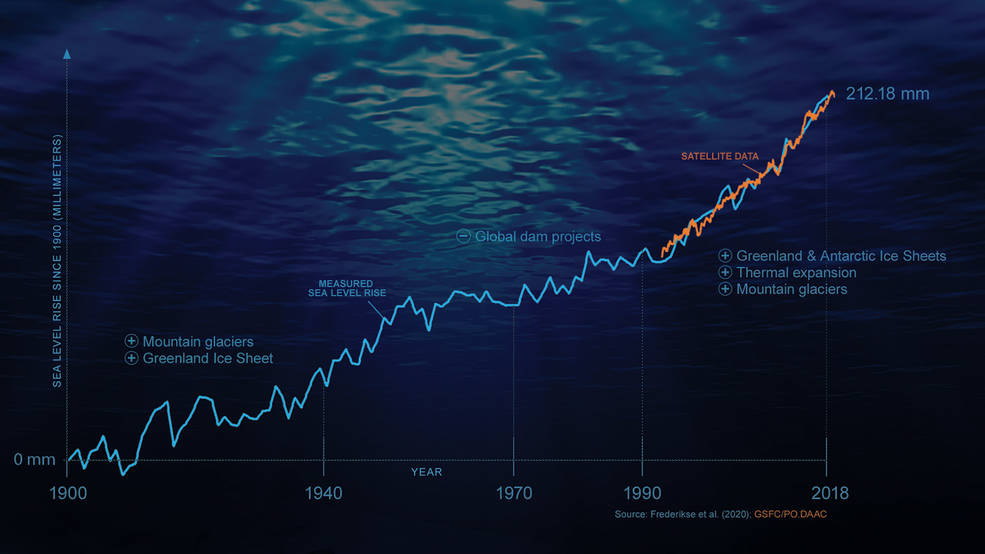

## Overview
This tutorial analyzes global sea level rise from satellite altimetry data and compares it to a historic record. We will be reproducing the plot from this infographic: [ NASA-led Study Reveals the Causes of Sea Level Rise Since 1900](https://grace.jpl.nasa.gov/news/113/nasa-led-study-reveals-the-causes-of-sea-level-rise-since-1900/). 

## Learning Objectives
- Search for data programmatically using keywords
- Access data within the AWS cloud using the `earthaccess` python library
- Visualize sea level rise trends from altimetry datasets and compare against historic records

## Requirements
### 1. Compute environment - This notebook can **only** be run in an **AWS Cloud instance running in the `us-west-2` region**.
### 2. Earthdata Login
An Earthdata Login account is required to access data, as well as discover restricted data, from the NASA Earthdata system. Thus, to access NASA data, you need Earthdata Login. Please visit https://urs.earthdata.nasa.gov to register and manage your Earthdata Login account. This account is free to create and only takes a moment to set up.

### Install Packages

In [1]:
import earthaccess
import xarray as xr
from pyproj import Geod
import numpy as np
import hvplot.xarray
from matplotlib import pyplot as plt
from pprint import pprint

We recommend authenticating your Earthdata Login (EDL) information using the `earthaccess` python package as follows:

In [2]:
auth = earthaccess.login(strategy="netrc") # works if the EDL login already been persisted to a netrc
if not auth.authenticated:
    # ask for EDL credentials and persist them in a .netrc file
    auth = earthaccess.login(strategy="interactive", persist=True)

You're now authenticated with NASA Earthdata Login
Using token with expiration date: 09/10/2023
Using .netrc file for EDL


## Search for Sea Surface Height Data

Let's find the first four collections that match a keyword search for `Sea Surface Height` and print out the first two.

In [3]:
collections = earthaccess.collection_query().keyword("SEA SURFACE HEIGHT").cloud_hosted(True).get(4)

# Let's print 2 collections
for collection in collections[0:2]:
    # pprint(collection.summary())
    print(pprint(collection.summary()), collection.abstract(), "\n", collection["umm"]["DOI"], "\n\n")

{'cloud-info': {'Region': 'us-west-2',
                'S3BucketAndObjectPrefixNames': ['podaac-ops-cumulus-public/SEA_SURFACE_HEIGHT_ALT_GRIDS_L4_2SATS_5DAY_6THDEG_V_JPL2205/',
                                                 'podaac-ops-cumulus-protected/SEA_SURFACE_HEIGHT_ALT_GRIDS_L4_2SATS_5DAY_6THDEG_V_JPL2205/'],
                'S3CredentialsAPIDocumentationURL': 'https://archive.podaac.earthdata.nasa.gov/s3credentialsREADME',
                'S3CredentialsAPIEndpoint': 'https://archive.podaac.earthdata.nasa.gov/s3credentials'},
 'concept-id': 'C2270392799-POCLOUD',
 'file-type': "[{'Format': 'netCDF-4', 'FormatType': 'Native', "
              "'AverageFileSize': 9.7, 'AverageFileSizeUnit': 'MB'}]",
 'get-data': ['https://cmr.earthdata.nasa.gov/virtual-directory/collections/C2270392799-POCLOUD',
              'https://search.earthdata.nasa.gov/search/granules?p=C2270392799-POCLOUD'],
 'short-name': 'SEA_SURFACE_HEIGHT_ALT_GRIDS_L4_2SATS_5DAY_6THDEG_V_JPL2205',
 'version': '2205'

## Access Data

The first dataset looks like it contains data from many altimetry missions, let's explore a bit more! We will access the first granule of the `SEA_SURFACE_HEIGHT_ALT_GRIDS_L4_2SATS_5DAY_6THDEG_V_JPL2205` collection in the month of May for every year that data is available and open the granules via xarray.

In [4]:
granules = []
for year in range(1990, 2019):
    granule = earthaccess.granule_query().short_name("SEA_SURFACE_HEIGHT_ALT_GRIDS_L4_2SATS_5DAY_6THDEG_V_JPL2205").temporal(f"{year}-05", f"{year}-06").get(1)
    if len(granule)>0:
        granules.append(granule[0])
print(f"Total granules: {len(granules)}")       

Total granules: 26


In [5]:
%%time

ds_SSH = xr.open_mfdataset(earthaccess.open(granules), chunks={})
ds_SSH

 Opening 26 granules, approx size: 0.0 GB


SUBMITTING | :   0%|          | 0/26 [00:00<?, ?it/s]

PROCESSING | :   0%|          | 0/26 [00:00<?, ?it/s]

COLLECTING | :   0%|          | 0/26 [00:00<?, ?it/s]

CPU times: user 5.79 s, sys: 846 ms, total: 6.64 s
Wall time: 24.9 s


<xarray.Dataset>
Dimensions:      (Time: 26, Longitude: 2160, nv: 2, Latitude: 960)
Coordinates:
  * Longitude    (Longitude) float32 0.08333 0.25 0.4167 ... 359.6 359.8 359.9
  * Latitude     (Latitude) float32 -79.92 -79.75 -79.58 ... 79.58 79.75 79.92
  * Time         (Time) datetime64[ns] 1993-05-03T12:00:00 ... 2018-05-02T12:...
Dimensions without coordinates: nv
Data variables:
    Lon_bounds   (Time, Longitude, nv) float32 dask.array<chunksize=(1, 2160, 2), meta=np.ndarray>
    Lat_bounds   (Time, Latitude, nv) float32 dask.array<chunksize=(1, 960, 2), meta=np.ndarray>
    Time_bounds  (Time, nv) datetime64[ns] dask.array<chunksize=(1, 2), meta=np.ndarray>
    SLA          (Time, Latitude, Longitude) float32 dask.array<chunksize=(1, 960, 2160), meta=np.ndarray>
    SLA_ERR      (Time, Latitude, Longitude) float32 dask.array<chunksize=(1, 960, 2160), meta=np.ndarray>
Attributes: (12/21)
    Conventions:            CF-1.6
    ncei_template_version:  NCEI_NetCDF_Grid_Template_v2.0
    Institution:            Jet Propulsion Laboratory
    geospatial_lat_min:     -79.916664
    geospatial_lat_max:     79.916664
    geospatial_lon_min:     0.083333336
    ...                     ...
    version_number:         2205
    Data_Pnts_Each_Sat:     {"16": 780190, "1001": 668288}
    source_version:         commit dc95db885c920084614a41849ce5a7d417198ef3
    SLA_Global_MEAN:        -0.027657876081274502
    SLA_Global_STD:         0.0859016072308609
    latency:                final

## Plot Sea Level Anomalies

In [6]:
ds_SSH.SLA.hvplot.image(y='Latitude', x='Longitude', cmap='viridis')

:DynamicMap   [Time]
   :Image   [Longitude,Latitude]   (SLA)

## Recreate the Sea Level Rise Infographic
First, we define a function that will calculate the area in 1/6 by 1/6 degree boxes in order to calculate the global mean of the SSH later.

In [7]:
def ssl_area(lats):
    """
    Calculate the area associated with a 1/6 by 1/6 degree box at latitude specified in 'lats'.
    
    Parameter
    ==========
    lats: a list or numpy array of size N the latitudes of interest. 
    
    Return
    =======
    out: Array (N) area values (unit: m^2)
    """
    # Define WGS84 as CRS:
    geod = Geod(ellps='WGS84')
    dx=1/12.0
    # create a lambda function for calculating the perimeters of the boxes
    c_area=lambda lat: geod.polygon_area_perimeter(np.r_[-dx,dx,dx,-dx], lat+np.r_[-dx,-dx,dx,dx])[0]
    out=[]
    for lat in lats:
        out.append(c_area(lat))
    return np.array(out)

Let's use the function on our Sea Surface Height dataset.

In [8]:
# note: they rotated the data in the last release, this operation used to be (1,-1)
ssh_area = ssl_area(ds_SSH.Latitude.data).reshape(-1,1)
print(ssh_area.shape)

(960, 1)


Next, we find and open the historic record dataset also using `earthaccess` and `xarray`.

In [9]:
historic_ts_results = earthaccess.search_data(short_name='JPL_RECON_GMSL')

Granules found: 1


In [10]:
historic_ts=xr.open_mfdataset(earthaccess.open([historic_ts_results[0]]), engine='h5netcdf')
historic_ts

 Opening 1 granules, approx size: 0.0 GB


SUBMITTING | :   0%|          | 0/1 [00:00<?, ?it/s]

PROCESSING | :   0%|          | 0/1 [00:00<?, ?it/s]

COLLECTING | :   0%|          | 0/1 [00:00<?, ?it/s]

<xarray.Dataset>
Dimensions:                                             (time: 119)
Coordinates:
  * time                                                (time) datetime64[ns] ...
Data variables: (12/21)
    global_average_sea_level_change                     (time) float32 dask.array<chunksize=(119,), meta=np.ndarray>
    global_average_sea_level_change_upper               (time) float32 dask.array<chunksize=(119,), meta=np.ndarray>
    global_average_sea_level_change_lower               (time) float32 dask.array<chunksize=(119,), meta=np.ndarray>
    glac_mean                                           (time) float32 dask.array<chunksize=(119,), meta=np.ndarray>
    glac_upper                                          (time) float32 dask.array<chunksize=(119,), meta=np.ndarray>
    glac_lower                                          (time) float32 dask.array<chunksize=(119,), meta=np.ndarray>
    ...                                                  ...
    global_average_thermosteric_sea_level_change        (time) float32 dask.array<chunksize=(119,), meta=np.ndarray>
    global_average_thermosteric_sea_level_change_upper  (time) float32 dask.array<chunksize=(119,), meta=np.ndarray>
    global_average_thermosteric_sea_level_change_lower  (time) float32 dask.array<chunksize=(119,), meta=np.ndarray>
    sum_of_contrib_processes_mean                       (time) float32 dask.array<chunksize=(119,), meta=np.ndarray>
    sum_of_contrib_processes_upper                      (time) float32 dask.array<chunksize=(119,), meta=np.ndarray>
    sum_of_contrib_processes_lower                      (time) float32 dask.array<chunksize=(119,), meta=np.ndarray>
Attributes: (12/42)
    title:                     Global sea-level changes and contributing proc...
    summary:                   This file contains reconstructed global-mean s...
    id:                        10.5067/GMSLT-FJPL1
    naming_authority:          gov.nasa.jpl
    source:                    Frederikse et al. The causes of sea-level rise...
    project:                   NASA sea-level change science team (N-SLCT)
    ...                        ...
    time_coverage_start:       1900-01-01
    time_coverage_end:         2018-12-31
    time_coverage_duration:    P119Y
    time_coverage_resolution:  P1Y
    date_created:              2020-07-28
    date_modified:             2020-09-14

#### Let's Plot!

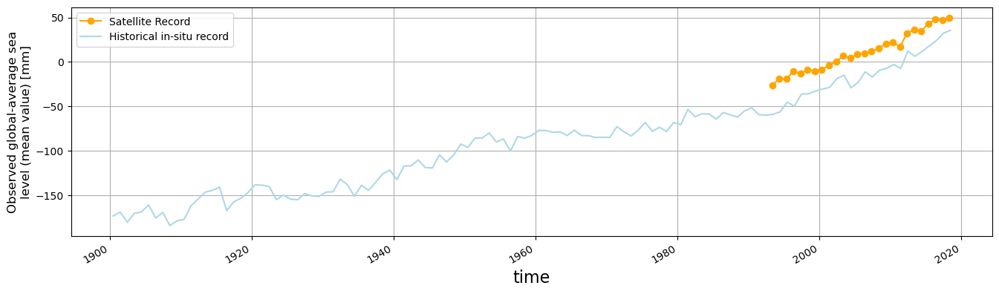

CPU times: user 3.33 s, sys: 1.04 s, total: 4.37 s
Wall time: 4.05 s


In [11]:
%%time

plt.rcParams["figure.figsize"] = (16,4)

fig, axs = plt.subplots()
plt.grid(True)

#function to get the global mean for plotting
def global_mean(SLA, **kwargs):
    dout=((SLA*ssh_area).sum()/(SLA/SLA*ssh_area).sum())*1000
    return dout

result = ds_SSH.SLA.groupby('Time').apply(global_mean)

plt.xlabel('Time (year)',fontsize=16)
plt.ylabel('Global Mean SLA (meter)',fontsize=12)
plt.grid(True)

result.plot(ax=axs, color="orange", marker="o", label='Satellite Record')

historic_ts['global_average_sea_level_change'].plot(ax=axs, label='Historical in-situ record', color="lightblue")

plt.legend()
plt.show()

> This Data Story used content from Luis Lopez's [earthaccess tutorial](https://github.com/betolink/earthaccess-gallery/blob/main/notebooks/Sea_Level_Rise/SSL.ipynb), which was based on Jinbo Wang's [Earthdata Webinar tutorial](https://github.com/betolink/the-coding-club/blob/main/notebooks/Earthdata_webinar_20220727.ipynb).